In [1]:
import os
import sys
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
sys.path.append("../")

import torch
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

from model import build_model
from clip_ import load, tokenize, similarity_score
from vit_cam import interpret_vit, interpret_vit_overlapped
from rn_cam import interpret_rn, interpret_rn_overlapped
sys.path.append("../pytorch-grad-cam")
from pytorch_grad_cam import GradCAM, \
    ScoreCAM, \
    GradCAMPlusPlus, \
    AblationCAM, \
    XGradCAM, \
    EigenCAM, \
    EigenGradCAM, \
    LayerCAM, \
    FullGrad

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
model_rn, preprocess = load("RN101", device=device, jit=False)
model_vit, preprocess = load("ViT-B/32", device=device, jit=False)

100%|███████████████████████████████████████| 292M/292M [00:25<00:00, 11.4MiB/s]
100%|████████████████████████████████████████| 354M/354M [00:01<00:00, 315MiB/s]


In [4]:
model_types = ["ViT", "ResNet"] 

font = {
    'size': 42,
}

ori_preprocess = Compose([
        Resize((224), interpolation=Image.BICUBIC),
        CenterCrop(size=(224, 224)),
        ToTensor()])

root = "../../Images/"

## Text-Image

In [5]:
res_dir = "../../results/pos_neg_vis/txt_img/"

if not os.path.exists(res_dir):
    os.mkdir(res_dir)
    
img_ids = ["horse&dog.jpg", "horse&sheep.jpg", "cow&sheep.jpg", "astronaut.png", "el2.jpeg"]#, "vase_or_face.png", "duck-rabbit.jpeg"]

text_lists = [["a horse", "a dog"],
              ["a horse", "a sheep"],
              ["a cow", "a sheep"],
              ["a rocket", "an astronaut"],
              ["an elephant", "a zebra"]
             ]


/home/mamooler/miniconda/envs/habitat/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


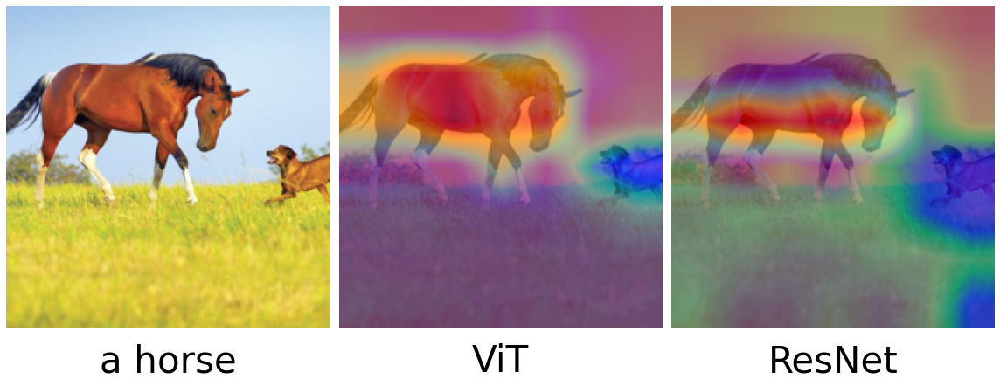

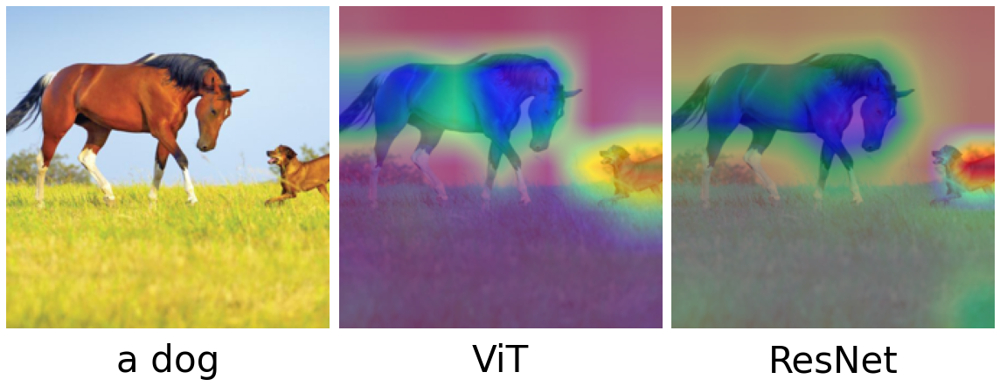

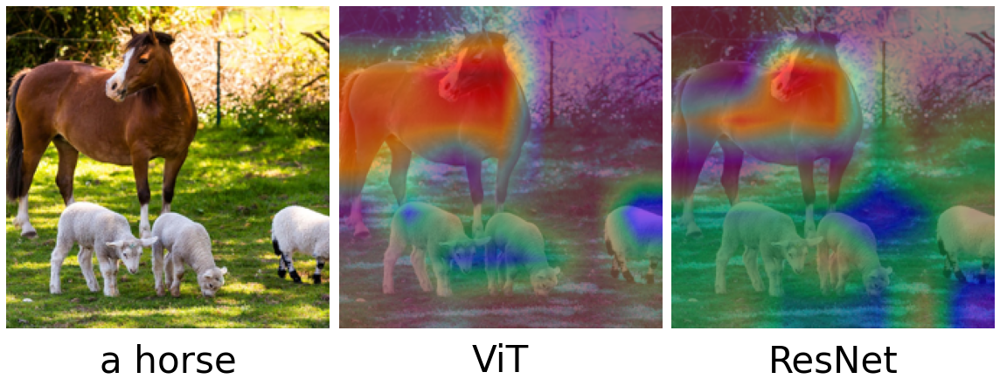

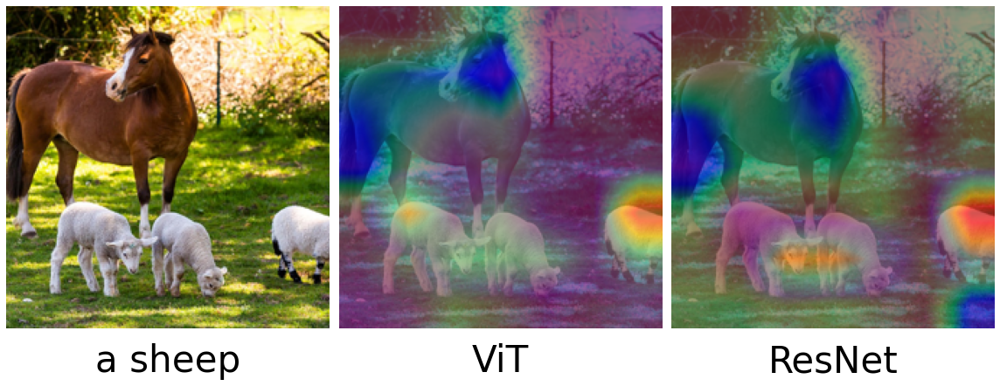

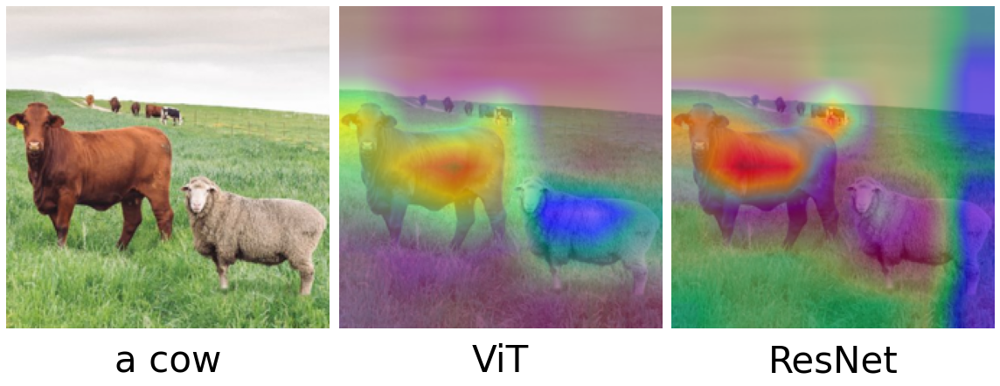

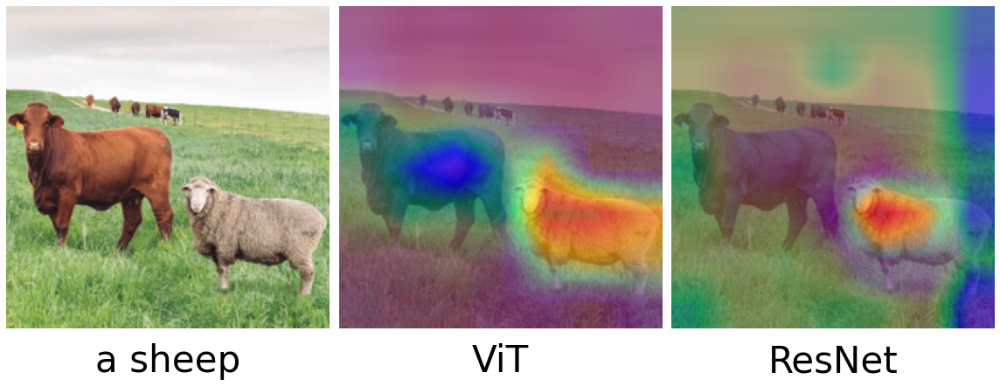

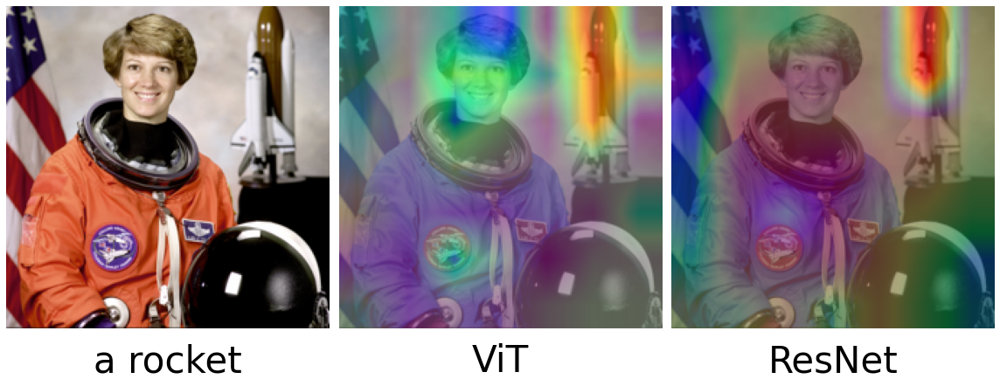

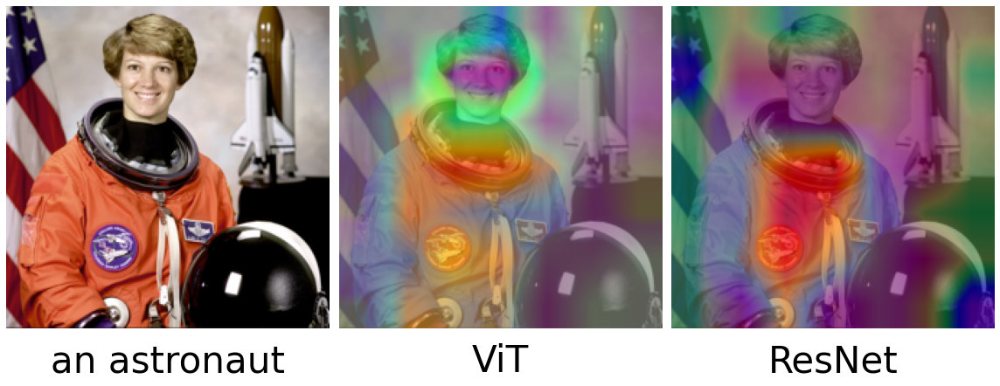

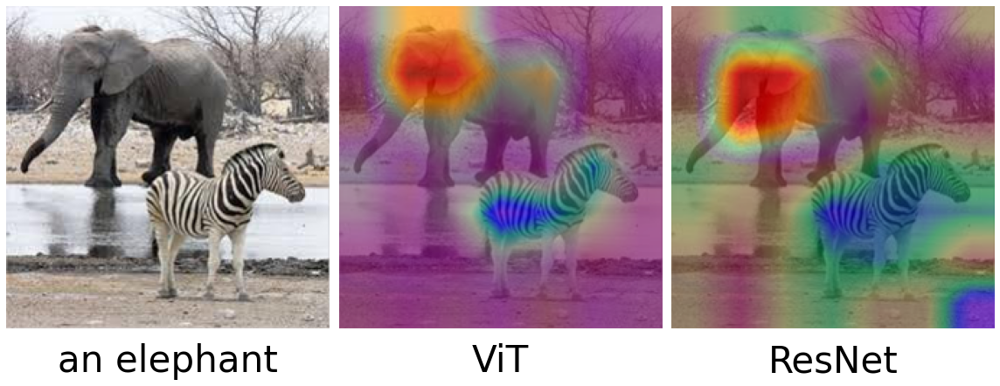

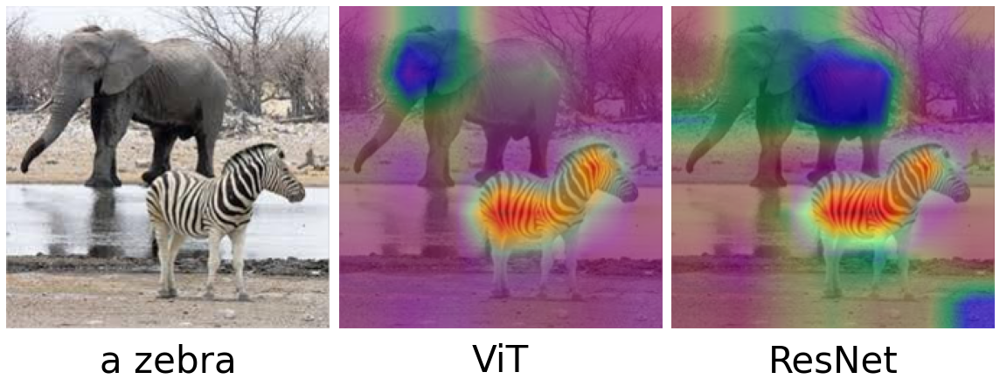

In [6]:
pp = PdfPages(res_dir + 'all.pdf')
#fig, ax = plt.subplots(len(2*img_ids), 3, figsize=(16,16))

for id_, img_id in enumerate(img_ids):
    
    texts = text_lists[id_]
    
    for t_id, text in enumerate(texts):
        
        t_text = tokenize(text).to(device)
        
        for neg in [None]:
            
            img_path =  os.path.join(root, img_id )
            image = ori_preprocess(Image.open(img_path))

            plt.figure(figsize=(16, 16))
            plt.tight_layout()
            plt.subplot(131)
            plt.imshow(image.permute(1, 2, 0))
            plt.axis('off')
            if neg==None: caption = text+"\n overlapped  | blue:neg, red: pos"
            elif neg==True: caption = text+"\n negative | blue: high, red: low"
            else: caption = text+ "\n positive | blue:low, red:high"
            plt.title(text, **font, y=-0.15)
        
            p_image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)

            subplot = 132
                
            for model_id, model_type in enumerate(model_types):
                
                plt.subplot(subplot+model_id)
            
                if model_type=="ViT":
                    text_features = model_vit.encode_text(t_text)
                    if not neg==None:
                        interpret_vit(p_image.type(model_vit.dtype), text_features, model_vit.visual, device, neg_saliency=neg)
                    else:
                        interpret_vit_overlapped(p_image.type(model_vit.dtype), text_features, model_vit.visual, device)

                else:
                    text_features = model_rn.encode_text(t_text) 
                    if not neg==None:
                        interpret_rn(p_image.type(model_rn.dtype), text_features, model_rn.visual, GradCAM, device, neg_saliency=neg)
                    else:
                        interpret_rn_overlapped(p_image.type(model_rn.dtype), text_features, model_rn.visual, GradCAM, device)
                            
                

                plt.axis('off')
                plt.title(model_type, **font,y=-0.15)
                plt.tight_layout()
                
            plt.savefig(res_dir+f"{neg}_{text}_{img_id}")
            
        pp.savefig()
        
pp.close()

## Image-Image

In [7]:
res_dir = "../../results/pos_neg_vis/img_img/"

if not os.path.exists(res_dir):
    os.mkdir(res_dir)
    
img1_ids = ["horse&dog.jpg", "horse&sheep.jpg", "cow&sheep.jpg", "el2.jpeg"]

img2_ids = [["horse.jpg", "dog.jpg", "horse_sketch.jpg", "dog_sketch.jpg"], 
            ["horse.jpg", "sheep.jpg", "horse_comic.jpg", "sheep_comic.jpg"], 
            ["cow.jpg", "sheep.jpg", "cow_comic.jpg", "sheep_comic.jpg"], 
            ["elephant.jpg", "zebra.jpg"]
           ]

/home/mamooler/miniconda/envs/habitat/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


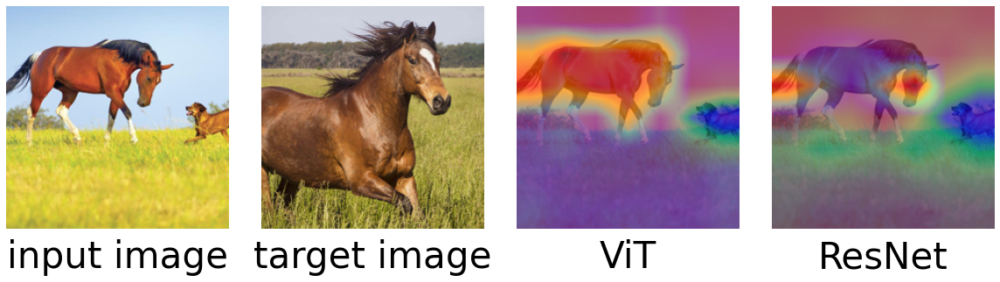

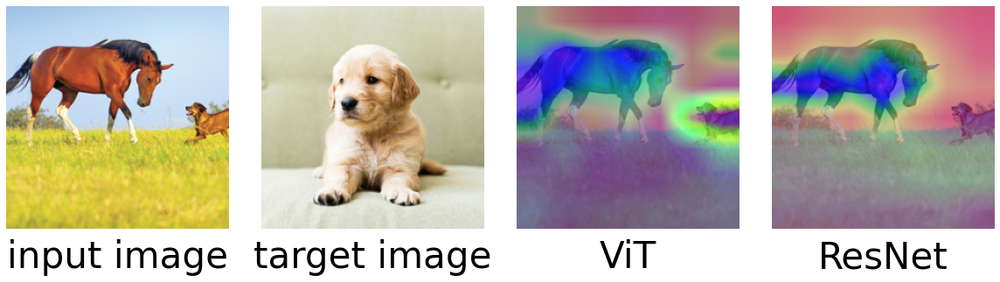

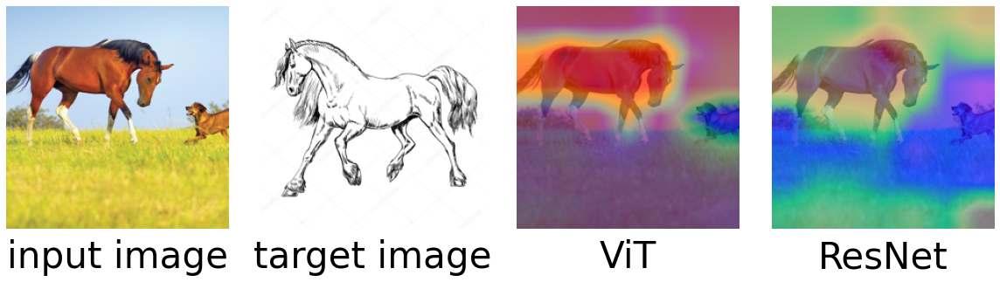

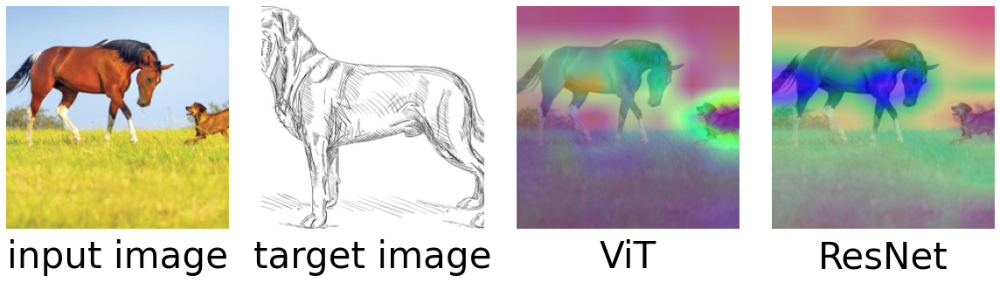

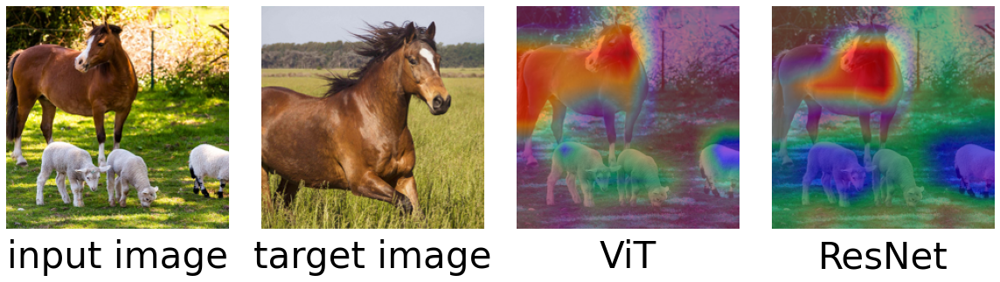

...

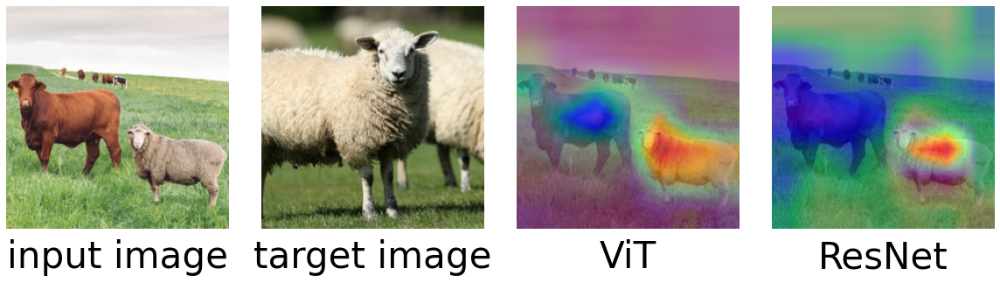

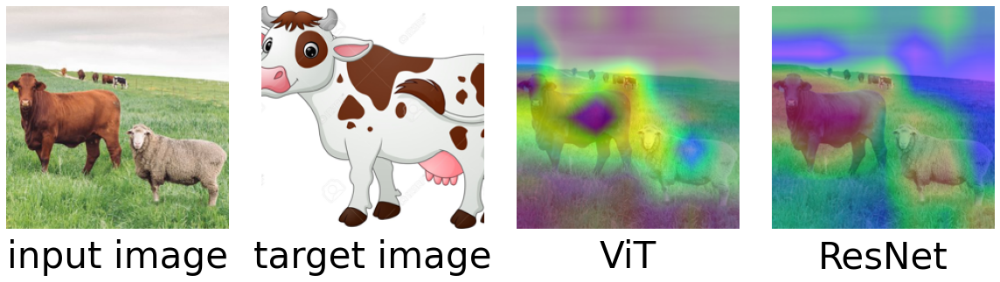

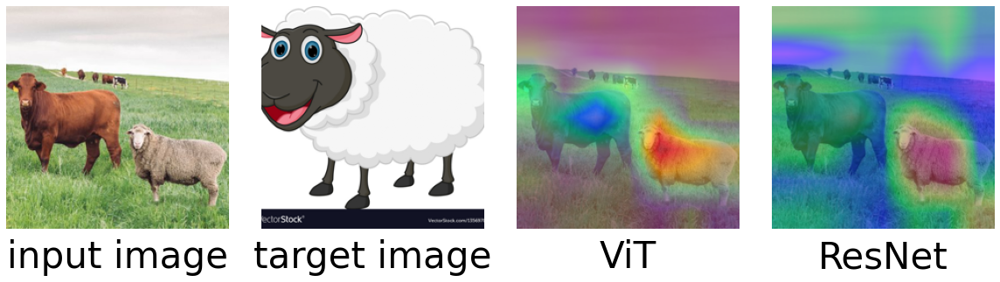

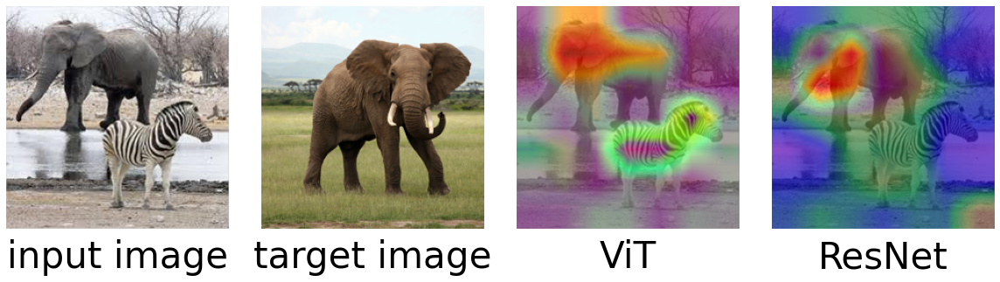

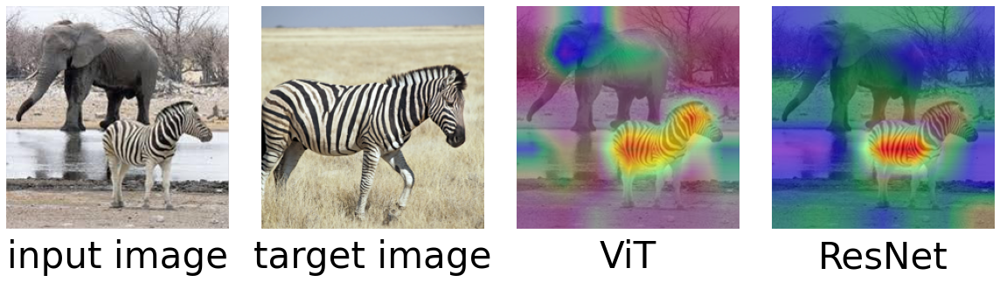

In [8]:
pp = PdfPages(res_dir + 'all.pdf')

for id1, img1_id in enumerate(img1_ids):
    imgs = img2_ids[id1]
    for id2,img2_id in enumerate(imgs):
        
        img1_path =  os.path.join(root, img1_id)
        image1 = ori_preprocess(Image.open(img1_path))
        p_image1 = preprocess(Image.open(img1_path)).unsqueeze(0).to(device)
        
        img2_path =  os.path.join(root, img2_id)
        image2 = ori_preprocess(Image.open(img2_path))
        p_image2 = preprocess(Image.open(img2_path)).unsqueeze(0).to(device)
        
        

        for neg in [None]:

            plt.figure(figsize=(16, 16))
            plt.tight_layout()
            plt.subplot(141)
            plt.imshow(image1.permute(1, 2, 0))
            plt.axis('off')
            if neg==None: caption = "overlapped | blue:neg, red: pos"
            elif neg==True: caption = "negative | blue: high, red: low"
            else: caption = "positive | blue:low, red:high"
            plt.title("input image", **font, y=-0.20)

            plt.tight_layout()
            plt.subplot(142)
            plt.imshow(image2.permute(1, 2, 0))
            plt.title("target image", **font, y=-0.20)
            plt.axis('off')


            for model_id, model_type in enumerate(model_types):

                plt.subplot(143+model_id)
                
                if model_type=="ViT":
                    target_features = model_vit.encode_image(p_image2)
                    target_features = target_features.detach()
                    
                    if not neg==None:
                        interpret_vit(p_image1.type(model_vit.dtype), target_features, model_vit.visual, device, neg_saliency=neg)
                    else:
                        interpret_vit_overlapped(p_image1.type(model_vit.dtype), target_features, model_vit.visual, device)

                else:
                    target_features = model_rn.encode_image(p_image2)
                    target_features = target_features.detach()
                    
                    if not neg==None:
                        interpret_rn(p_image1.type(model_rn.dtype), target_features, model_rn.visual, GradCAM, device, neg_saliency=neg)
                    else:
                        interpret_rn_overlapped(p_image1.type(model_rn.dtype), target_features, model_rn.visual, GradCAM, device)


                plt.title(model_type, **font,y=-0.20)
                plt.tight_layout()
                plt.axis('off')
            
            plt.savefig(res_dir+f"{neg}_{img2_id[:-4]}_{img1_id}")
            
        pp.savefig()
        
pp.close()              